# Image Generation via Generative Adversarial Networks (GANs) 

In [1]:
import os
from pyexpat import model
import torch
from torchvision import transforms
from tqdm.auto import tqdm
from torch.utils.data import DataLoader
from torch import nn
import matplotlib.pyplot as plt
import statistics
import numpy as np
from torchvision.utils import make_grid 
from torchvision.utils import save_image

In [2]:
from MyDataset import MyDataset
from MyEval import MyEval
from MyModel import MyDiscriminator, MyGenerator
from MyResult import MyResult
from MyTrain import MyTrain
from MySample import MySample

## construct dataset for training

In [3]:
dataset = MyDataset(path='data', split='train')
print(f'number of data = {len(dataset)}')

number of data = 100


## construct dataloader

In [4]:
batch_size = 100
dataloader = DataLoader(dataset, batch_size=batch_size, drop_last=True, shuffle=True)

## plot the dataset

In [5]:
iter_data   = iter(dataloader)
image       = next(iter_data)
dim_channel = image.size(1)
dim_height  = image.size(2)
dim_width   = image.size(3)
print(f'image : (shape) = {image.shape}')
print(f'image : (dtype) = {image.dtype}')
print(f'image : (min) = {image.min()}, (max) = {image.max()}')
print(f'dim_channel = {dim_channel}, dim_height = {dim_height}, dim_width = {dim_width}')

image : (shape) = torch.Size([100, 1, 32, 32])
image : (dtype) = torch.float32
image : (min) = 0.0, (max) = 1.0
dim_channel = 1, dim_height = 32, dim_width = 32


## plot the training images

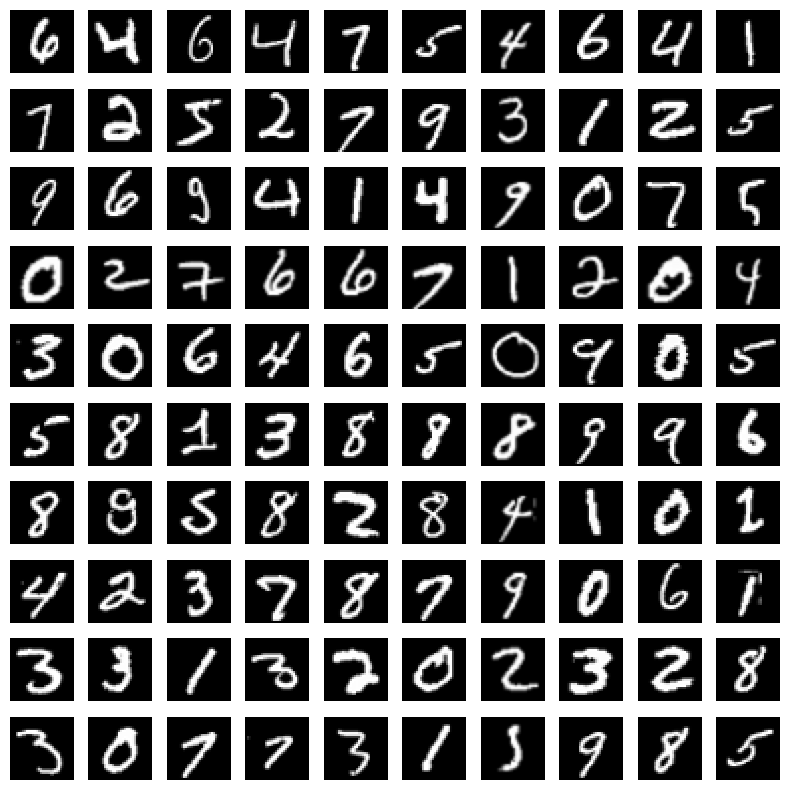

In [6]:
nRow = 10
nCol = 10
plt.figure(figsize=(8, 8))
for i in range(nRow):
    for j in range(nCol):
        idx = nCol * i + j
        plt.subplot(nRow, nCol, idx+1)
        plt.axis('off')
        plt.imshow(image[idx].squeeze(0), cmap='gray')
plt.tight_layout()
plt.show()

## construct model

In [7]:
discriminator   = MyDiscriminator(dim_channel, dim_height, dim_width)
generator       = MyGenerator(dim_channel, dim_height, dim_width)

## train

In [8]:
trainer = MyTrain(generator, discriminator)
trainer.train(dataset)

Epoch [1/100000] G_Loss: 1.3366, D_Loss: 0.9963
Epoch 1 fake min/max: 0.1657196283340454 0.6579294204711914
Epoch [2/100000] G_Loss: 1.4682, D_Loss: 1.4021
Epoch 2 fake min/max: 0.22192582488059998 0.6763116121292114
Epoch [3/100000] G_Loss: 1.5942, D_Loss: 1.2824
Epoch 3 fake min/max: 0.22432824969291687 0.6755356788635254
Epoch [4/100000] G_Loss: 1.9375, D_Loss: 1.2041
Epoch 4 fake min/max: 0.2297174632549286 0.656352162361145
Epoch [5/100000] G_Loss: 1.9402, D_Loss: 1.0578
Epoch 5 fake min/max: 0.2296246886253357 0.6526682376861572
Epoch [6/100000] G_Loss: 1.6595, D_Loss: 0.7709
Epoch 6 fake min/max: 0.23768436908721924 0.6766290068626404
Epoch [7/100000] G_Loss: 2.2410, D_Loss: 0.6873
Epoch 7 fake min/max: 0.23852066695690155 0.663361132144928
Epoch [8/100000] G_Loss: 2.4004, D_Loss: 0.5778
Epoch 8 fake min/max: 0.23272480070590973 0.680185854434967
Epoch [9/100000] G_Loss: 1.8994, D_Loss: 0.6489
Epoch 9 fake min/max: 0.20694828033447266 0.6513835191726685
Epoch [10/100000] G_Loss:

## plot losses (generator loss and discriminator loss)

Text(0, 0.5, 'loss')

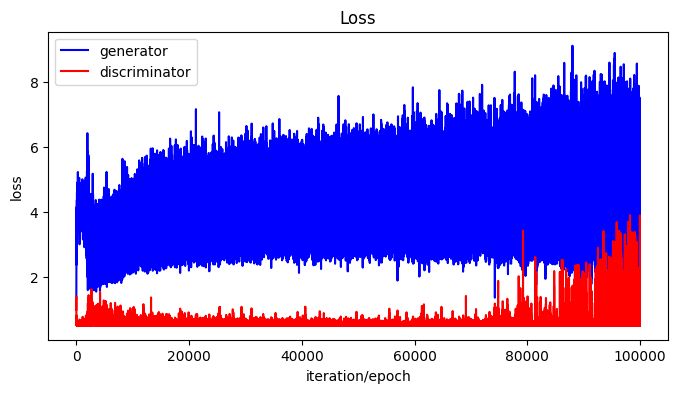

In [9]:
loss_generator     = trainer.get_loss_generator()
loss_discriminator = trainer.get_loss_discriminator()

plt.figure(figsize=(8, 4))
plt.plot(loss_generator, '-', color='blue', label='generator')
plt.plot(loss_discriminator, '-', color='red', label='discriminator')
plt.legend()
plt.title('Loss')
plt.xlabel('iteration/epoch')
plt.ylabel('loss')


## save the trained models

In [10]:
torch.save(discriminator.state_dict(), 'discriminator.pth')
torch.save(generator.state_dict(), 'generator.pth')

## generate samples

In [11]:
sampler     = MySample(trainer.get_generator())
num_sample  = 100
batch_size  = 10
num_batch   = num_sample // batch_size
list_sample = []

for i in range(num_batch):
    sample = sampler.sample(batch_size)
    list_sample.append(sample)
    
samples = torch.cat(list_sample, dim=0)

In [12]:
print(samples.shape, samples.dtype)
print(samples.min().item(), samples.max().item())

torch.Size([100, 1, 32, 32]) torch.float32
6.774193429511313e-15 0.9999817609786987


## save samples

In [13]:
num_sample  = samples.size(0)
dir_save    = os.path.join('data', 'sample')
os.makedirs(dir_save, exist_ok=True)

for i in range(num_sample):
    save_image(samples[i], os.path.join(dir_save, f'{i:03d}.png'))

## plot samples

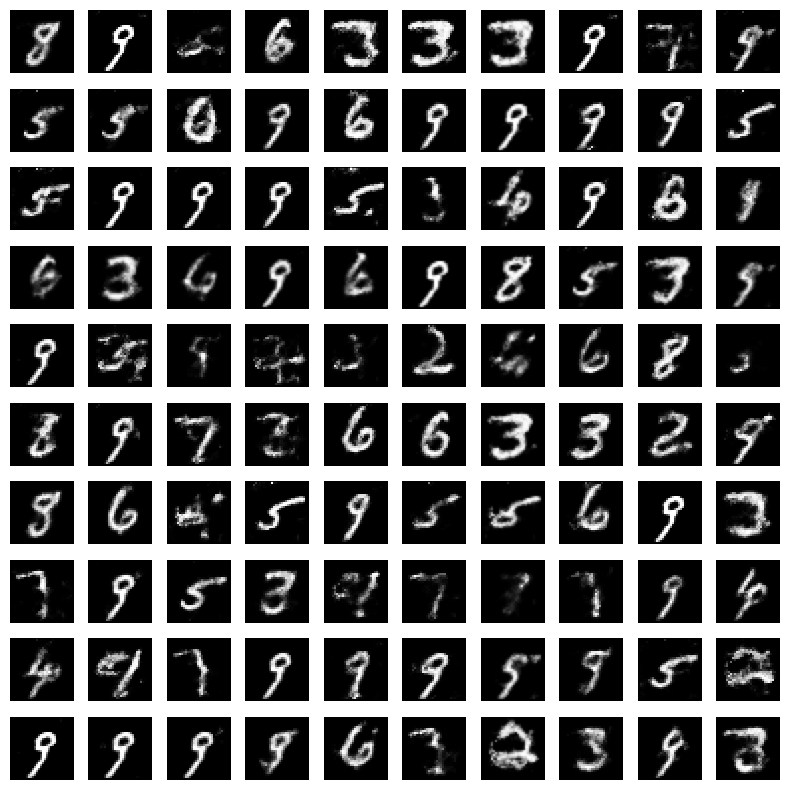

In [14]:
nRow = 10
nCol = 10
plt.figure(figsize=(8, 8))
for i in range(nRow):
    for j in range(nCol):
        idx = nCol * i + j
        plt.subplot(nRow, nCol, idx+1)
        plt.axis('off')
        plt.imshow(samples[idx].squeeze(0), cmap='gray')
plt.tight_layout()
plt.show()

## evaluation

In [15]:
eval    = MyEval(metric='fid')
fid     = eval.compute()
print(f'==================================================')
print(f'fid = {fid}')
print(f'==================================================')

update real dataset...
update fake dataset...
fid = 106.56388854980469


## save results

In [16]:
result = MyResult()
result.add_result('fid', fid)
result.add_result('loss_generator', loss_generator)
result.add_result('loss_discriminator', loss_discriminator)
result.save()